In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

train_set_path = r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_train.csv'
train_set = pd.read_csv(train_set_path)

train_set.drop(['Unnamed: 0'], axis=1, inplace=True)

train_set

,Temperature,pCH4_per_pO2,Contact time,Y(C2)_predicted
0,1004.0,1.9,0.040,2.683631
1,1023.0,4.0,0.060,7.919782
2,1013.0,2.0,0.550,14.124533
3,1023.0,4.0,0.370,7.904139
4,903.0,3.0,0.370,0.427436
...,...,...,...,...
1564,1024.6,6.0,0.288,5.243119
1565,1024.6,6.0,0.360,11.650596
1566,1024.6,6.0,0.432,7.399032
1567,1024.6,6.0,0.504,7.399032


In [3]:
test_set_path = r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_test.csv'
test_set = pd.read_csv(test_set_path)

test_set.drop(['Unnamed: 0'], axis=1, inplace=True)

test_set

,Temperature,pCH4_per_pO2,Contact time,Y(C2)_predicted
0,1092.0,2.1,0.150,16.146929
1,1124.0,2.2,0.150,17.852878
2,1175.0,2.0,0.150,23.288527
3,1123.0,2.7,0.150,17.690870
4,1151.0,2.7,0.150,20.950115
...,...,...,...,...
7804,1187.0,6.0,1.152,20.409223
7805,1187.0,6.0,1.224,20.409223
7806,1187.0,6.0,1.296,20.409223
7807,1187.0,6.0,1.368,20.409223


In [3]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
interpolation_data = scaler.fit_transform(interpolation_data)

In [4]:
scaled_rev_data = pd.DataFrame(interpolation_data, columns=['Temperature', 'pCH4_per_pO2', 'Contact time', 'YC2'])
interpolation_data

array([[0.79525862, 0.22      , 0.10416667, 0.59438291],
       [0.86422414, 0.24      , 0.10416667, 0.65718043],
       [0.97413793, 0.2       , 0.10416667, 0.85727156],
       ...,
       [1.        , 1.        , 0.9       , 0.7512818 ],
       [1.        , 1.        , 0.95      , 0.7512818 ],
       [1.        , 1.        , 1.        , 0.7512818 ]])

In [25]:
train_set_mask_final = (
    scaled_rev_data['Temperature'].between(0.15, 0.85) &
    scaled_rev_data['pCH4_per_pO2'].between(0.15, 0.85) &
    scaled_rev_data['Contact time'].between(0.15, 0.85)
)
test_set_mask_final = ~train_set_mask_final

In [26]:
# Applying the masks to split the data
train_set = scaled_rev_data[train_set_mask_final]
test_set = scaled_rev_data[test_set_mask_final]

In [27]:
train_set

,Temperature,pCH4_per_pO2,Contact time,YC2
22,0.754310,0.2,0.381944,0.731876
23,0.625000,0.2,0.381944,0.519937
24,0.668103,0.2,0.381944,0.660728
25,0.711207,0.2,0.381944,0.645995
26,0.754310,0.2,0.381944,0.731876
...,...,...,...,...
7522,0.800000,0.8,0.650000,0.585731
7523,0.800000,0.8,0.700000,0.585731
7524,0.800000,0.8,0.750000,0.585731
7525,0.800000,0.8,0.800000,0.585731


In [28]:
test_set

,Temperature,pCH4_per_pO2,Contact time,YC2
0,0.795259,0.22,0.104167,0.594383
1,0.864224,0.24,0.104167,0.657180
2,0.974138,0.20,0.104167,0.857272
3,0.862069,0.34,0.104167,0.651217
4,0.922414,0.34,0.104167,0.771193
...,...,...,...,...
9373,1.000000,1.00,0.800000,0.751282
9374,1.000000,1.00,0.850000,0.751282
9375,1.000000,1.00,0.900000,0.751282
9376,1.000000,1.00,0.950000,0.751282


In [29]:
X_train = train_set.drop(['YC2'], axis=1)
y_train = train_set['YC2']
X_test = test_set.drop(['YC2'], axis=1)
y_test = test_set['YC2']

In [30]:
from sklearn.model_selection import cross_val_score
import numpy as np
from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
import warnings
from bayes_opt import BayesianOptimization
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score

best_params = {}

def cv_score_rfr(n_estimators, max_depth, min_samples_split, min_samples_leaf):
    model = RandomForestRegressor(n_estimators=int(n_estimators), 
                                  max_depth=int(max_depth), 
                                  min_samples_split=int(min_samples_split), 
                                  min_samples_leaf=int(min_samples_leaf), 
                                  random_state=42
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    return np.mean(scores)

pbounds = {
    'n_estimators': (10, 1000),
    'max_depth': (1, 50),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 10)
}

optimizer = BayesianOptimization(f=cv_score_rfr, pbounds=pbounds, random_state=42)
optimizer.maximize(init_points=50, n_iter=500)
best_params['RF'] = optimizer.max['params']

# Function to optimize of the hyperparameters of the XGBoost
def cv_score_xgb(n_estimators, max_depth, min_child_weight, gamma, subsample, colsample_bytree, learning_rate):
    model = XGBRegressor(n_estimators=int(n_estimators), 
                         max_depth=int(max_depth), 
                         min_child_weight=min_child_weight, 
                         gamma=gamma, 
                         subsample=subsample, 
                         colsample_bytree=colsample_bytree, 
                         learning_rate=learning_rate, 
                         random_state=42
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    return np.mean(scores)

pbounds = {
    'n_estimators': (10, 1000),
    'max_depth': (1, 50),
    'min_child_weight': (1, 10),
    'gamma': (0, 10),
    'subsample': (0.5, 1),
    'colsample_bytree': (0.5, 1),
    'learning_rate': (0.0001, 0.1)
}

optimizer = BayesianOptimization(f=cv_score_xgb, pbounds=pbounds, random_state=42)
optimizer.maximize(init_points=50, n_iter=500)
best_params['XGB'] = optimizer.max['params']

def cv_score_lgbm(n_estimators, max_depth, min_child_weight, min_child_samples, subsample, colsample_bytree, learning_rate):
    model = LGBMRegressor(n_estimators=int(n_estimators),
                            max_depth=int(max_depth),
                            min_child_weight=min_child_weight,
                            min_child_samples=int(min_child_samples),
                            subsample=subsample,
                            colsample_bytree=colsample_bytree,
                            learning_rate=learning_rate,
                            random_state=42
        )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    return np.mean(scores)

pbounds = {
    'n_estimators': (10, 1000),
    'max_depth': (1, 50),
    'min_child_weight': (1, 10),
    'min_child_samples': (1, 10),
    'subsample': (0.5, 1),
    'colsample_bytree': (0.5, 1),
    'learning_rate': (0.0001, 0.1)
}

optimizer = BayesianOptimization(f=cv_score_lgbm, pbounds=pbounds, random_state=42)
optimizer.maximize(init_points=50, n_iter=500)
best_params['LGBM'] = optimizer.max['params']

from sklearn.ensemble import ExtraTreesRegressor
def cv_score_etr(n_estimators, max_depth, min_samples_split, min_samples_leaf, max_features, max_leaf_nodes, min_impurity_decrease):
    model = ExtraTreesRegressor(n_estimators=int(n_estimators), 
                                  max_depth=int(max_depth), 
                                  min_samples_split=int(min_samples_split), 
                                  min_samples_leaf=int(min_samples_leaf), 
                                  max_features=max_features, 
                                  max_leaf_nodes=int(max_leaf_nodes), 
                                  min_impurity_decrease=min_impurity_decrease, 
                                  random_state=42
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    return np.mean(scores)

pbounds ={
    'n_estimators': (10, 1000),
    'max_depth': (1, 50),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 10),
    'max_features': (0.5, 1),
    'max_leaf_nodes': (2, 10),
    'min_impurity_decrease': (0, 0.1)
}

optimizer = BayesianOptimization(f=cv_score_etr, pbounds=pbounds, random_state=42)
optimizer.maximize(init_points=50, n_iter=500)
best_params['ETR'] = optimizer.max['params']

from catboost import CatBoostRegressor

def cv_score_cbr(iterations, learning_rate, depth, l2_leaf_reg):
    model = CatBoostRegressor(iterations=int(iterations), 
                              learning_rate=learning_rate, 
                              depth=int(depth), 
                              l2_leaf_reg=l2_leaf_reg, 
                              random_state=42
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    return np.mean(scores)

pbounds = {"iterations": (1, 100), 
           "learning_rate": (0.001, 0.1), 
           "depth": (1, 10), 
           "l2_leaf_reg": (1, 10)}

optimizer = BayesianOptimization(f=cv_score_cbr, pbounds=pbounds, random_state=42)
optimizer.maximize(init_points=50, n_iter=500)
best_params['CBR'] = optimizer.max['params']

|   iter    |  target   | max_depth | min_sa... | min_sa... | n_esti... |
-------------------------------------------------------------------------
| 1         | -0.003633 | 19.35     | 9.556     | 7.856     | 602.7     |
| 2         | -0.002817 | 8.645     | 2.404     | 2.465     | 867.5     |
| 3         | -0.003458 | 30.45     | 7.373     | 2.165     | 970.2     |
| 4         | -0.002841 | 41.79     | 2.911     | 3.455     | 191.6     |
| 5         | -0.003339 | 15.91     | 5.723     | 5.456     | 298.3     |
| 6         | -0.002819 | 30.98     | 2.255     | 4.337     | 372.7     |
| 7         | -0.003543 | 23.35     | 8.067     | 3.597     | 519.1     |
| 8         | -0.002684 | 30.03     | 1.418     | 6.86      | 178.8     |
| 9         | -0.005065 | 4.188     | 9.54      | 9.725     | 810.3     |
| 10        | -0.002651 | 15.93     | 1.879     | 7.474     | 445.8     |
| 11        | -0.003909 | 6.98      | 5.457     | 2.275     | 910.2     |
| 12        | -0.003435 | 13.68     | 

In [31]:
from sklearn.metrics import mean_squared_error, r2_score

validation_rmse = {}
validation_r2 = {}

# Random Forest
best_rfr_params = best_params['RF']
best_rfr_params['n_estimators'] = int(round(best_rfr_params['n_estimators']))
best_rfr_params['max_depth'] = int(round(best_rfr_params['max_depth']))
best_rfr_params['min_samples_split'] = int(round(best_rfr_params['min_samples_split']))
best_rfr_params['min_samples_leaf'] = int(round(best_rfr_params['min_samples_leaf']))
rfr_model = RandomForestRegressor(**best_rfr_params)
rfr_model.fit(X_train, y_train)
rfr_predictions = rfr_model.predict(X_test)
rfr_rmse = np.sqrt(mean_squared_error(y_test, rfr_predictions))
rfr_r2 = r2_score(y_test, rfr_predictions)
validation_rmse['RFR'] = rfr_rmse
validation_r2['RFR'] = rfr_r2

# XGBoost
best_xgb_params = best_params['XGB']
best_xgb_params['n_estimators'] = int(round(best_xgb_params['n_estimators']))
best_xgb_params['max_depth'] = int(round(best_xgb_params['max_depth']))
xgb_model = XGBRegressor(**best_xgb_params)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))
xgb_r2 = r2_score(y_test, xgb_predictions)
validation_rmse['XGB'] = xgb_rmse
validation_r2['XGB'] = xgb_r2

# # LightGBM
best_lgbm_params = best_params['LGBM']
best_lgbm_params['n_estimators'] = int(round(best_lgbm_params['n_estimators']))
best_lgbm_params['max_depth'] = int(round(best_lgbm_params['max_depth']))
best_lgbm_params['min_child_samples'] = int(round(best_lgbm_params['min_child_samples']))
lgbm_model = LGBMRegressor(**best_lgbm_params)
lgbm_model.fit(X_train, y_train)
lgbm_predictions = lgbm_model.predict(X_test)
lgbm_rmse = np.sqrt(mean_squared_error(y_test, lgbm_predictions))
lgbm_r2 = r2_score(y_test, lgbm_predictions)
validation_rmse['LGBM'] = lgbm_rmse
validation_r2['LGBM'] = lgbm_r2

# Extra Trees Regressor
best_etr_params = best_params['ETR']
best_etr_params['n_estimators'] = int(round(best_etr_params['n_estimators']))
best_etr_params['max_depth'] = int(round(best_etr_params['max_depth']))
best_etr_params['min_samples_split'] = int(round(best_etr_params['min_samples_split']))
best_etr_params['min_samples_leaf'] = int(round(best_etr_params['min_samples_leaf']))
best_etr_params['max_leaf_nodes'] = int(round(best_etr_params['max_leaf_nodes']))
etr_model = ExtraTreesRegressor(**best_etr_params)
etr_model.fit(X_train, y_train)
etr_predictions = etr_model.predict(X_test)
etr_rmse = np.sqrt(mean_squared_error(y_test, etr_predictions))
etr_r2 = r2_score(y_test, etr_predictions)
validation_rmse['ETR'] = etr_rmse
validation_r2['ETR'] = etr_r2

# CatBoost
best_cb_params = best_params['CBR']
best_cb_params['iterations'] = int(round(best_cb_params['iterations']))
best_cb_params['depth'] = int(round(best_cb_params['depth']))
cb_model = CatBoostRegressor(**best_cb_params, verbose=False)
cb_model.fit(X_train, y_train)
cb_predictions = cb_model.predict(X_test)
cb_rmse = np.sqrt(mean_squared_error(y_test, cb_predictions))
cb_r2 = r2_score(y_test, cb_predictions)
validation_rmse['CB'] = cb_rmse
validation_r2['CB'] = cb_r2

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 2970, number of used features: 3
[LightGBM] [Info] Start training from score 0.235718
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[0.8788322104315834, 0.8787310946432012, 0.8779446414295352, 0.7254315927316183, 0.8738842933234314]


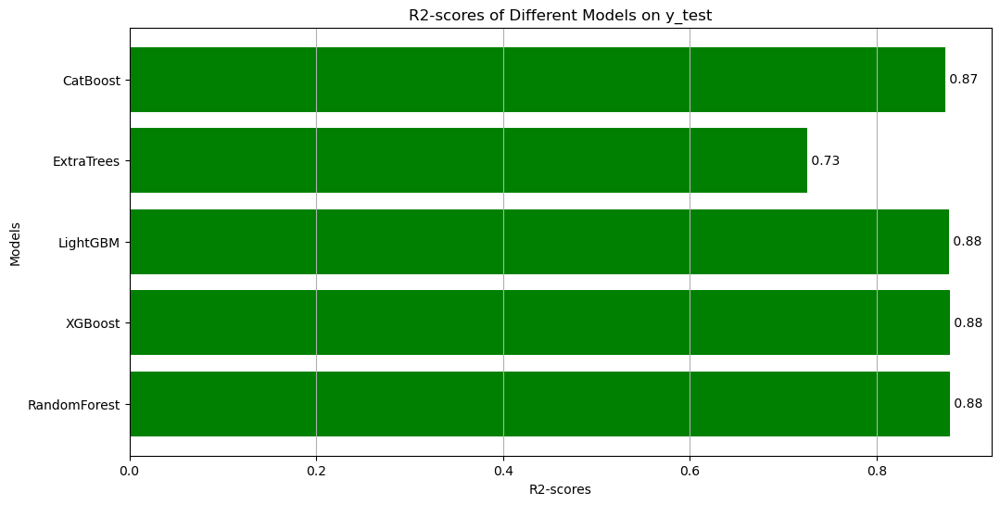

In [32]:
import matplotlib.pyplot as plt

print([rfr_r2, xgb_r2, lgbm_r2, etr_r2, cb_r2])

mse_values = [rfr_r2, xgb_r2, lgbm_r2, etr_r2, cb_r2]
model_names = ['RandomForest', 'XGBoost', 'LightGBM', 'ExtraTrees', 'CatBoost']


# Plotting the MSE values for each model
plt.figure(figsize=(12, 6))
plt.barh(model_names, mse_values, color='green')
plt.xlabel('R2-scores')
plt.ylabel('Models')
plt.title('R2-scores of Different Models on y_test')
plt.grid(axis='x')

# Annotate each bar with the specific MSE value
for i, v in enumerate(mse_values):
    plt.text(v, i, " {:.2f}".format(v), va='center', color='black')

plt.show()

In [33]:
from sklearn.metrics import mean_squared_error, r2_score

validation_rmse_train = {}
validation_r2_train = {}

# Random Forest
best_rfr_params = best_params['RF']
best_rfr_params['n_estimators'] = int(round(best_rfr_params['n_estimators']))
best_rfr_params['max_depth'] = int(round(best_rfr_params['max_depth']))
best_rfr_params['min_samples_split'] = int(round(best_rfr_params['min_samples_split']))
best_rfr_params['min_samples_leaf'] = int(round(best_rfr_params['min_samples_leaf']))
rfr_model = RandomForestRegressor(**best_rfr_params)
rfr_model.fit(X_train, y_train)
rfr_predictions_train = rfr_model.predict(X_train)
rfr_rmse_train = np.sqrt(mean_squared_error(y_train, rfr_predictions_train))
rfr_r2_train = r2_score(y_train, rfr_predictions_train)
validation_rmse_train['RFR'] = rfr_rmse_train
validation_r2_train['RFR'] = rfr_r2_train

# XGBoost
best_xgb_params = best_params['XGB']
best_xgb_params['n_estimators'] = int(round(best_xgb_params['n_estimators']))
best_xgb_params['max_depth'] = int(round(best_xgb_params['max_depth']))
xgb_model = XGBRegressor(**best_xgb_params)
xgb_model.fit(X_train, y_train)
xgb_predictions_train = xgb_model.predict(X_train)
xgb_rmse_train = np.sqrt(mean_squared_error(y_train, xgb_predictions_train))
xgb_r2_train = r2_score(y_train, xgb_predictions_train)
validation_rmse_train['XGB'] = xgb_rmse_train
validation_r2_train['XGB'] = xgb_r2_train

# # LightGBM
best_lgbm_params = best_params['LGBM']
best_lgbm_params['n_estimators'] = int(round(best_lgbm_params['n_estimators']))
best_lgbm_params['max_depth'] = int(round(best_lgbm_params['max_depth']))
best_lgbm_params['min_child_samples'] = int(round(best_lgbm_params['min_child_samples']))
lgbm_model = LGBMRegressor(**best_lgbm_params)
lgbm_model.fit(X_train, y_train)
lgbm_predictions_train = lgbm_model.predict(X_train)
lgbm_rmse_train = np.sqrt(mean_squared_error(y_train, lgbm_predictions_train))
lgbm_r2_train = r2_score(y_train, lgbm_predictions_train)
validation_rmse_train['LGBM'] = lgbm_rmse_train
validation_r2_train['LGBM'] = lgbm_r2_train

# Extra Trees Regressor
best_etr_params = best_params['ETR']
best_etr_params['n_estimators'] = int(round(best_etr_params['n_estimators']))
best_etr_params['max_depth'] = int(round(best_etr_params['max_depth']))
best_etr_params['min_samples_split'] = int(round(best_etr_params['min_samples_split']))
best_etr_params['min_samples_leaf'] = int(round(best_etr_params['min_samples_leaf']))
best_etr_params['max_leaf_nodes'] = int(round(best_etr_params['max_leaf_nodes']))
etr_model = ExtraTreesRegressor(**best_etr_params)
etr_model.fit(X_train, y_train)
etr_predictions_train = etr_model.predict(X_train)
etr_rmse_train = np.sqrt(mean_squared_error(y_train, etr_predictions_train))
etr_r2_train = r2_score(y_train, etr_predictions_train)
validation_rmse_train['ETR'] = etr_rmse_train
validation_r2_train['ETR'] = etr_r2_train

# CatBoost
best_cb_params = best_params['CBR']
best_cb_params['iterations'] = int(round(best_cb_params['iterations']))
best_cb_params['depth'] = int(round(best_cb_params['depth']))
cb_model = CatBoostRegressor(**best_cb_params, verbose=False)
cb_model.fit(X_train, y_train)
cb_predictions_train = cb_model.predict(X_train)
cb_rmse_train = np.sqrt(mean_squared_error(y_train, cb_predictions_train))
cb_r2_train = r2_score(y_train, cb_predictions_train)
validation_rmse_train['CB'] = cb_rmse_train
validation_r2_train['CB'] = cb_r2_train

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 2970, number of used features: 3
[LightGBM] [Info] Start training from score 0.235718
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[0.9995922212623213, 0.9999269324922659, 0.9997026163074619, 0.8080575799148655, 0.9984146837158183]


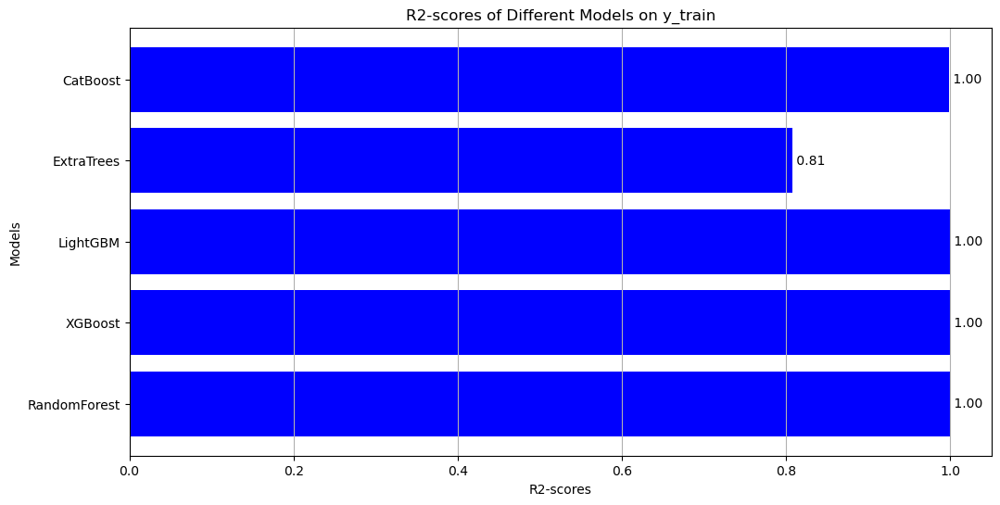

In [34]:
import matplotlib.pyplot as plt

print([rfr_r2_train, xgb_r2_train, lgbm_r2_train, etr_r2_train, cb_r2_train])

mse_values = [rfr_r2_train, xgb_r2_train, lgbm_r2_train, etr_r2_train, cb_r2_train]
model_names = ['RandomForest', 'XGBoost', 'LightGBM', 'ExtraTrees', 'CatBoost']


# Plotting the MSE values for each model
plt.figure(figsize=(12, 6))
plt.barh(model_names, mse_values, color='blue')
plt.xlabel('R2-scores')
plt.ylabel('Models')
plt.title('R2-scores of Different Models on y_train')
plt.grid(axis='x')

# Annotate each bar with the specific MSE value
for i, v in enumerate(mse_values):
    plt.text(v, i, " {:.2f}".format(v), va='center', color='black')

plt.show()